# TODO: work on pred_dann so it adapts to the new architecture

In [1]:
import numpy as np
np.random.seed(0) 

import argparse

import os
import math
from math import sin

import json

import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder

import seaborn as sns

import time

import wandb

import matplotlib
import matplotlib.pyplot as plt
plt.style.use('seaborn-white')
matplotlib.rc( 'savefig', facecolor = 'white' )
from matplotlib import pyplot
%matplotlib inline

import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision import transforms, datasets, models
from torchsummary import summary
torch.manual_seed(0)

i_seed = 0

from datetime import datetime
import pytz
import pprint

import sys
sys.path.append('../') # add this line so Data and data are visible in this file
sys.path.append('../../') # add this line so Data and data are visible in this file
sys.path.append('../PatchWand/') # add this line so Data and data are visible in this file

# from PatchWand import *
from plotting_tools import *
from handy_tools import *
from setting import *
from evaluate import *

from stage3_preprocess import *
from stage4_regression import *
from dataIO import *
from FL_extension.training_util import *
from FL_extension.dataset_util import *
from FL_extension.evaluation_util import *
from FL_extension.models import *
from FL_extension.models_CNNlight import *
# from unet_extension.training_util import *

from importlib import reload
%load_ext autoreload
%autoreload 2

In [2]:
print(torch.version.cuda)

10.2


In [3]:
parser = argparse.ArgumentParser(description='SpO2_estimate')
parser.add_argument('--input_folder', metavar='input_folder', help='input_folder',
                    default='../')
parser.add_argument('--output_folder', metavar='output_folder', help='output_folder',
                    default='../')
parser.add_argument('--subject_id', metavar='subject_id', help='subject_id',
                    default='101')
parser.add_argument('--training_params_file', metavar='training_params_file', help='training_params_file',
                    default='training_params_list.json')


# checklist 3: comment first line, uncomment second line
# args = parser.parse_args(['--input_folder', '../../data/stage3_FL/win8_overlap75', 
#                           '--output_folder', '../../data/stage4_FL/',
# #                           '--training_params_file', 'training_params_baseline.json',
#                           '--training_params_file', 'training_params_dummy.json',
#                          ])
args = parser.parse_args(['--input_folder', '../../data/stage3/win60_overlap90/', 
                          '--output_folder', '../../data/stage4_FL/',
#                           '--training_params_file', 'training_params_baseline.json',
#                           '--training_params_file', 'training_params_dummy.json',
#                           '--training_params_file', 'training_params_STFT.json',
                          # '--training_params_file', 'training_params_computation.json',
                          '--training_params_file', 'training_params_shortWin.json',
#                           '--training_params_file', 'training_params_RespiratoryRegression.json',
                         ])
# args = parser.parse_args()
print(args)

Namespace(input_folder='../../data/stage3/win60_overlap90/', output_folder='../../data/stage4_FL/', subject_id='101', training_params_file='training_params_shortWin.json')


In [4]:
# if 1==1 :
#     print('hi')

# start timing

In [5]:

tz_NY = pytz.timezone('America/New_York') 
datetime_start = datetime.now(tz_NY)
print("start time:", datetime_start.strftime("%Y-%b-%d %H:%M:%S"))



start time: 2023-May-17 16:09:04


In [6]:
inputdir = args.input_folder
outputdir = args.output_folder
training_params_file = args.training_params_file

outputdir = outputdir + '{}/'.format(training_params_file.split('.json')[0].split('_')[-1])


if not os.path.exists(outputdir):
    os.makedirs(outputdir)

In [7]:
# inputdir

# get training params and dataloaders

In [8]:
torch.cuda.is_available()

True

In [9]:
def get_model_out_names(training_params):
    model_out_names = []

#     for output_name in training_params['output_names']:
    for output_name in training_params['output_names']+['domain']:
        for input_name in training_params['input_names']:
            model_out_names.append(output_name+'-{}'.format(input_name))
    return model_out_names

In [10]:
def get_modality_dict(training_params):
    label_encoder = LabelEncoder()
    modality_encoded = label_encoder.fit_transform(training_params['input_names'])
#     modality_encoded # array([0, 1])

    modality_dict = {}
    for i_modality in modality_encoded:
        modality_dict[training_params['input_names'][i_modality]] = i_modality
#     training_params['modality_dict'] = modality_dict
    return modality_dict

In [11]:
def get_regressor_names(training_params):
    training_params['regressor_names'] = []
    main_task_name = training_params['output_names'][0]
    
    for output_name in training_params['output_names']:
        if output_name == main_task_name:
            training_params['regressor_names'].append(output_name)
        else:
            for input_name in training_params['input_names']:
                training_params['regressor_names'].append(output_name + '-' + input_name)
                
    return training_params

In [12]:
# training_params_file

In [13]:
with open(training_params_file) as json_file:
    training_params_list = json.load(json_file)

for training_params in [training_params_list[0]]:
    
    # 1. store device info
    # include device in training_params
    if training_params['cuda_i']==-1:
        device = torch.device('cpu')
    else:
        device = torch.device('cuda:{}'.format(int(training_params['cuda_i'])) if torch.cuda.is_available() else 'cpu')
    training_params['device'] = device
    
    # 2. check training mode (subject_ind [default] vs. subject_specific)
    if 'training_mode' in training_params:
        training_mode = training_params['training_mode']
    else:
        training_params = 'subject_ind'
    
    # 3. transfer some info from stage3_dict to training_params
    stage3_dict = data_loader('stage3_dict', inputdir).item()
    training_params['list_signal'] = stage3_dict['list_signal']
    training_params['list_feature'] = stage3_dict['list_feature']
    training_params['list_output'] = stage3_dict['list_output']
    training_params['list_meta'] = stage3_dict['list_meta']
    training_params['FS_RESAMPLE_DL'] = stage3_dict['FS_RESAMPLE_DL']
    training_params['subject_ids'] = stage3_dict['subject_ids']
    training_params['task_ids'] = stage3_dict['task_ids']
    training_params['sequence'] = stage3_dict['sequence']
    
    # 4. get data loaders (TODO: load data into script once to save IO time)
    # [change it] first change CV_config so get_loaders prepare the data correctly though
    training_params['CV_config'] = {
        'subject_id': 113,
#         'task_id': 5,
    }
    dataloaders, dataset_sizes = get_loaders(inputdir, training_params)
    print('data dimensions are:', dataloaders['train'].dataset.data.shape)
    print('# of windows:', dataset_sizes['train']+dataset_sizes['val'])
    
    data_dimensions = dataloaders['train'].dataset.__getitem__(0)[0].size()
    training_params['data_dimensions'] = list(data_dimensions)
    del dataloaders
    
    # 5. get sweep name (is this necessary?)
    sweep_name = training_params['sweep_name'] 
    
    # 6. get the right feature extractor function
    if training_params['model_name'] == 'FeatureExtractor_CNN':
        training_params['feature_extractor'] = FeatureExtractor_CNN
    elif training_params['model_name'] == 'ResNet1D':
        training_params['feature_extractor'] = ResNet1D
    elif training_params['model_name'] == 'FeatureExtractor_CNN2':
        training_params['feature_extractor'] = FeatureExtractor_CNN2
    elif 'CNNlight' in training_params['model_name']: # designed for HR estimation
        training_params['feature_extractor'] = FeatureExtractor_CNNlight
        

    # 6. get the right feature extractor function
    if training_params['regressor_type'] == 'DominantFreqRegression':
        training_params['regressor'] = DominantFreqRegression
    elif training_params['regressor_type'] == 'FFTRegression':
        training_params['regressor'] = FFTRegression
    elif training_params['regressor_type'] == 'RespiratoryRegression':
        training_params['regressor'] = RespiratoryRegression

    # 7. store the ordered_subject_ids, inputdir, and outputdir
    training_params['ordered_subject_ids'] = np.asarray(training_params['ordered_subject_ids'])
#       "ordered_subject_ids": [101, 103, 104, 106, 107, 110, 111, 115, 116, 117, 118, 119, 120, 121, 113],
    # [101, 103, 104, 106, 111, 115, 116, 117, 118, 119, 120, 121, 113],
    
    training_params['inputdir'] = inputdir
    training_params['outputdir'] = outputdir
    
    # 8. get regressor_names ('domain-ECG_filt', 'HR_patch-ppg_ir_2_cardiac', etc.)
    # [change it]
    training_params = get_regressor_names(training_params)

    # 9. compute output_dim if it's LSTM
    # [change it]
    if 'LSTM' in training_params['model_name']:
        training_params = change_output_dim(training_params)

    # 10. get model output data keys ('domain-ECG_filt', 'HR_patch-ppg_ir_2_cardiac', etc., which tells me what data is used for computing the output)
    # [change it]
    training_params['model_out_names'] = get_model_out_names(training_params)
    
    # 11. encoder the modality to integers (the first is 0, the second is 1, etc.)
    # store the code in modality_dict
    training_params['modality_dict'] = get_modality_dict(training_params)

    # 12. get freq meta (what is the frequency for each spectral feature, mask it used label_range_dict['HR_DL'])
    training_params = update_freq_meta(training_params)

# training_params = training_params_list[0]

data dimensions are: (417, 2, 6000)
# of windows: 438


In [14]:
# stage3_dict

In [15]:
training_params['xf_masked'].shape

(110,)

In [16]:
# training_params['model_out_names']

In [17]:
# training_params['regressor_names']

In [18]:
# outputdir = outputdir+training_params['model_name']+'/'
# if not os.path.exists(outputdir):
#     os.makedirs(outputdir)
    

# define trainer, evaler, preder functions

In [19]:
trainer = train_dann
evaler = eval_dann
preder = pred_dann

# some random param
## kernel_size = 5 ~ 16*100/300 (16 for 300 Hz sampling rate, 5 for 100 sampling rate)


In [20]:
if training_params['model_name'] == 'ResNet1D':
# reference: https://github.com/hsd1503/resnet1d/blob/master/test_physionet.py
    training_params['base_filters'] = training_params['channel_n'] # [64] 
    training_params['in_channels'] = training_params['data_dimensions']
#     training_params['increasefilter_gap'] = [training_params['downsample_gap'][0] * 2]
    training_params['n_block'] = training_params['n_block_macro'] * training_params['downsample_gap']
    training_params['increasefilter_gap'] = training_params['downsample_gap']
    

In [21]:
# training_params['data_dimensions']

# test the model

In [22]:
def test_model_lstm(training_params):
    print('test_model_lstm')

    print('using model ', training_params['model_name'])

    # prepare model
    model = resp_multiverse(training_params=training_params)
    model = model.to(device).float()

    # prepare data
    dataloaders, dataset_sizes = get_loaders(inputdir, training_params)

    data = dataloaders['val'].dataset.data[:5,:,:]
    data = torch.from_numpy(data)

    feature = dataloaders['val'].dataset.feature[:5,:]
    feature = torch.from_numpy(feature)

    label = dataloaders['val'].dataset.label[:5,:]
    label = torch.from_numpy(label)

    data = data.to(device=device, dtype=torch.float)
    feature = feature.to(device=device, dtype=torch.float)
    label = label.to(device=device, dtype=torch.float)

    # model inference
    out = model(data, feature)

    # compute loss
    criterion = MultiTaskLoss(training_params)
    losses = criterion(out, label)

    # check losses
    print(losses)
    del model

    
def test_model(training_params):
    print('test_model')

    print('using model ', training_params['model_name'])

    model = resp_multiverse(training_params=training_params)
    summary(model, input_size=[tuple(training_params['data_dimensions']), (model.N_features,1)], device='cpu')
    print(model)
    del model
    
def test_model_dann(training_params):
    print('test_model_dann')
    print('using model ', training_params['model_name'])

    model = resp_DANN(training_params=training_params)
    print(model)

    summary(model, input_size=[tuple(training_params['data_dimensions']), (model.N_features,1)], device='cpu')
    
    pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print('trainable pytorch_total_params:', pytorch_total_params)
    
    pytorch_total_params = sum(p.numel() for p in model.parameters())
    print('all pytorch_total_params:', pytorch_total_params)

    del model



debug_model = True
if debug_model==True:
    if 'LSTM' in training_params['model_name']:
        test_model_lstm(training_params)
    elif 'DANN' not in training_params['model_name']:
        test_model(training_params)
    else:
        test_model_dann(training_params)


test_model_dann
using model  CNNlight-DANN
feature_out_dim   : 110
feature_out_dim   : 110
resp_DANN(
  (feature_extractors): ModuleDict(
    (ECG_filt): FeatureExtractor_CNNlight(
      (basicblock_list): ModuleList(
        (0): InceptionBlock(
          (conv_k1x1): Sequential(
            (0): Conv1d(1, 8, kernel_size=(5,), stride=(1,), padding=(2,))
            (1): BatchNorm1d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU()
            (3): Conv1d(8, 8, kernel_size=(5,), stride=(1,), padding=(2,))
            (4): BatchNorm1d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (5): ReLU()
            (6): MyAvgPool1dPadSame(
              (avg_pool): AvgPool1d(kernel_size=(5,), stride=(2,), padding=(0,))
            )
          )
          (conv_k2x1): Sequential(
            (0): Conv1d(1, 8, kernel_size=(9,), stride=(1,), padding=(4,))
            (1): BatchNorm1d(8, eps=1e-05, momentum=0.1, affine=True, trac

In [23]:
check_model_params = True
check_inference = False

if check_model_params:

    model = resp_DANN(training_params=training_params)

    if 'ECG_filt' in training_params['input_names']:
        pytorch_total_params = sum(p.numel() for p in model.feature_extractors.ECG_filt.parameters() if p.requires_grad)
        print('ECG_filt pytorch_total_params:', pytorch_total_params)
    if 'scgZ' in training_params['input_names']:
        pytorch_total_params = sum(p.numel() for p in model.feature_extractors.scgZ.parameters() if p.requires_grad)
        print('scgZ pytorch_total_params:', pytorch_total_params)
    pytorch_total_params = sum(p.numel() for p in model.regressors.parameters() if p.requires_grad)
    print('regressors pytorch_total_params:', pytorch_total_params)
    pytorch_total_params = sum(p.numel() for p in model.domain_classifier.parameters() if p.requires_grad)
    print('domain_classifier pytorch_total_params:', pytorch_total_params)


    pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print('trainable pytorch_total_params:', pytorch_total_params)
    
    
    if check_inference:
        device = torch.device('cpu')
        # device = torch.device('cuda:{}'.format(int(training_params['cuda_i'])) if torch.cuda.is_available() else 'cpu')

        model = model.to(device).float()

        # prepare data
        dataloaders, dataset_sizes = get_loaders(inputdir, training_params)

        data = dataloaders['val'].dataset.data[[0],:,:]
        data = torch.from_numpy(data)

        feature = dataloaders['val'].dataset.feature[[0],:]
        feature = torch.from_numpy(feature)

        data = data.to(device=device, dtype=torch.float)
        feature = feature.to(device=device, dtype=torch.float)

        # model inference
        # out = model(data, feature)
        %timeit -n 1 -r 1000 out = model(data, feature)
    
    del model


feature_out_dim   : 110
feature_out_dim   : 110
ECG_filt pytorch_total_params: 9897
scgZ pytorch_total_params: 9897
regressors pytorch_total_params: 0
domain_classifier pytorch_total_params: 5652
trainable pytorch_total_params: 25446


# TODO
## make sure data can pass through the model

In [24]:
check_data_flow = False

if check_data_flow:

    dataloaders, dataset_sizes = get_loaders(inputdir, training_params)

    data = dataloaders['train'].dataset.data[:5,:,:]
    # data = torch
    data = torch.from_numpy(data)
    data = data.to(device=device, dtype=torch.float)

    feature = dataloaders['train'].dataset.feature[:5,:]
    # data = torch
    feature = torch.from_numpy(feature)
    feature = feature.to(device=device, dtype=torch.float)

    label = dataloaders['train'].dataset.label[:5,:]
    # data = torch
    label = torch.from_numpy(label)
    label = label.to(device=device, dtype=torch.float)

    model = resp_DANN(training_params=training_params)
    model = model.to(device).float()
    output = model(data, feature)

    print(data.size(), feature.size(), label.size(), output['domain-ECG_filt'].size())

## train, val, eval model

In [25]:
if training_params['wandb']:
    wandb.login()
    os.environ["WANDB_DIR"] = os.path.abspath(outputdir)
    os.environ["WANDB_NOTEBOOK_NAME"] = 'feature_learning'

In [26]:
def get_sweep_folder(training_params):
    n_block = training_params['n_block']
    inputs_combined = '+'.join([ i_name.split('_')[0] for i_name in training_params['input_names']])
    auxillary_weight = training_params['loss_weights']['auxillary_task']
    adversarial_weight = training_params['adversarial_weight']
    channel_n = training_params['channel_n']
    
    list_act = '+'.join( [str(int) for int in training_params['activity_names']] )
    
    sweep_folder = '{}blocks-{}-weight{}+{}-{}ch-act{}-{}'.format(n_block, inputs_combined, auxillary_weight, adversarial_weight, channel_n, list_act, training_params['regressor_type'])
    
    return sweep_folder


In [27]:
def get_outputdirs(training_params):

    outputdir = training_params['outputdir']
    sweep_folder = get_sweep_folder(training_params)
    outputdir_sweep = outputdir+'{}/'.format(sweep_folder)

    outputdir_numeric = outputdir_sweep + 'numeric_results/'
    if outputdir_numeric is not None:
        if not os.path.exists(outputdir_numeric):
            os.makedirs(outputdir_numeric)

    outputdir_modelout = outputdir_sweep + 'model_output/'
    if outputdir_modelout is not None:
        if not os.path.exists(outputdir_modelout):
            os.makedirs(outputdir_modelout)

    outputdir_activation = outputdir_sweep + 'activation_layers/'
    if outputdir_activation is not None:
        if not os.path.exists(outputdir_activation):
            os.makedirs(outputdir_activation)

    outputdir_feature = outputdir_sweep + 'feature_visualization/'
    if outputdir_feature is not None:
        if not os.path.exists(outputdir_feature):
            os.makedirs(outputdir_feature)

    training_params['outputdir_sweep'] = outputdir_sweep
    training_params['outputdir_numeric'] = outputdir_numeric
    training_params['outputdir_modelout'] = outputdir_modelout
    training_params['outputdir_activation'] = outputdir_activation
    training_params['outputdir_feature'] = outputdir_feature

    return training_params

# train model

In [28]:
training_params = get_outputdirs(training_params) # could be tricky since it changes several keys
training_params = get_regressor_names(training_params) # may not need this in this task

training_params['model_out_names'] = get_model_out_names(training_params)
training_params['modality_dict'] = get_modality_dict(training_params)
training_params = update_freq_meta(training_params) # could be tricky since it changes several keys



df_performance_train = {}
df_performance_val = {}

df_outputlabel_train = {}
df_outputlabel_val = {}

#     for task in training_params['tasks']:
#     for task in training_params['regressor_names']:
for task in training_params['model_out_names']:

    df_performance_train[task] = pd.DataFrame()
    df_performance_val[task] = pd.DataFrame()

    df_outputlabel_train[task] = pd.DataFrame()
    df_outputlabel_val[task] = pd.DataFrame()

ordered_subject_ids = training_params['ordered_subject_ids']
main_task = training_params['output_names'][0].split('-')[0]
i_activity = training_params['list_meta'].index('task') #  i_activity th column has the activity info


# try one subject only

In [44]:

# look at the interesting subjects first so I can quickly debug
# for i_CV, subject_id in enumerate(ordered_subject_ids):

i_CV = 9
subject_id = ordered_subject_ids[i_CV]

training_params['CV_config']['subject_id'] = subject_id

device = torch.device('cuda:{}'.format(int(training_params['cuda_i'])) if torch.cuda.is_available() else 'cpu')
print('using device', device)

# need to load the data for each LOSO CV
dataloaders, dataset_sizes = get_loaders(inputdir, training_params)
print('data dimensions are:', dataloaders['train'].dataset.data.shape)
print('dataset_sizes: ', dataset_sizes)

# update the dimension so the model is created correctly
data_dimensions = dataloaders['train'].dataset.__getitem__(0)[0].size()
training_params['data_dimensions'] = list(data_dimensions)

print('using model ', training_params['model_name'])

model = resp_DANN(training_params=training_params)
model = model.to(device).float()

optimizer = torch.optim.Adam(model.parameters(), lr=training_params['learning_rate'], weight_decay=0.01)

#         criterion = MultiTaskLoss(training_params)
criterion = AdversarialLoss(training_params)



training_params['criterion'] = criterion
training_params['optimizer'] = optimizer
training_params['inputdir'] = inputdir


#         print( training_params['regressor_names'])
CV_dict = train_model(model, training_params, dataloaders, trainer, evaler, preder)

#         print(CV_dict['performance_dict_val']['out_dict'])
#         sys.exit()


using device cuda:1
data dimensions are: (417, 2, 6000)
dataset_sizes:  {'train': 417, 'val': 21}
using model  CNNlight-DANN
feature_out_dim   : 110
feature_out_dim   : 110
	 start training.....
	 validate on subject 108
	[1th epoch]
	 done with training.....


In [45]:
# ordered_subject_ids

In [46]:
# criterion.criterions

# get validation data

In [47]:
data = dataloaders['val'].dataset.data
feature = dataloaders['val'].dataset.feature
label = dataloaders['val'].dataset.label

data = torch.from_numpy(data)
feature = torch.from_numpy(feature)
label = torch.from_numpy(label)

# 1. get data
data = data.to(device=device, dtype=torch.float)
feature = feature.to(device=device, dtype=torch.float)
label = label.to(device=device, dtype=torch.float)

# 2. infer by net

In [48]:
# fig, axes = plt.subplots(3,1,figsize=(8,6), dpi=120)
# xf, yf = get_psd(sig0, training_params['FS_RESAMPLE_DL'])
# axes[0].plot(xf[1:], yf[1:],  color='firebrick')

# xf, yf = get_psd(sig1, training_params['FS_RESAMPLE_DL'])
# axes[1].plot(xf[1:], yf[1:],  color='Teal')

# xf, yf = get_psd(deep_scg, training_params['FS_RESAMPLE_DL'])
# axes[2].plot(xf[1:], yf[1:],  color='Teal')


# for ax in axes:
#     ax_no_top_right(ax)

# testing on subjects

	 use S peaks
	 use S peaks


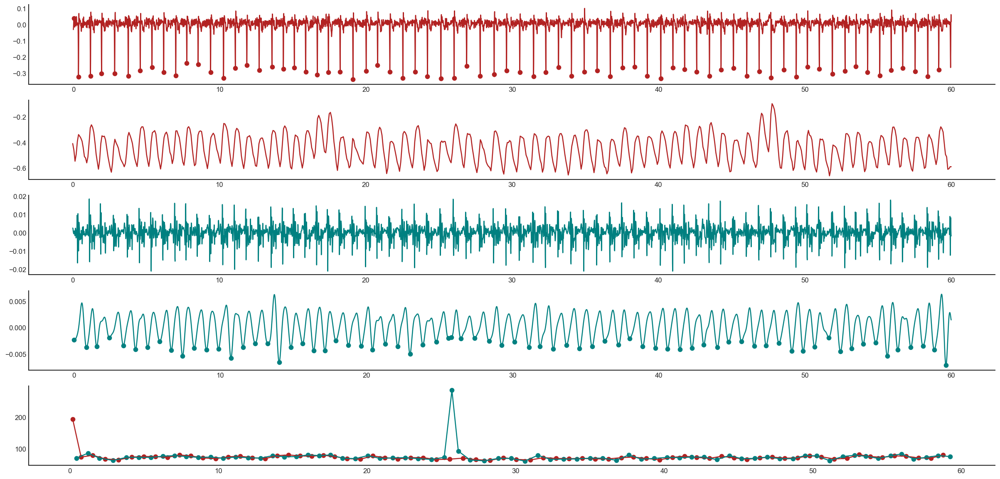

	 use S peaks
	 use S peaks


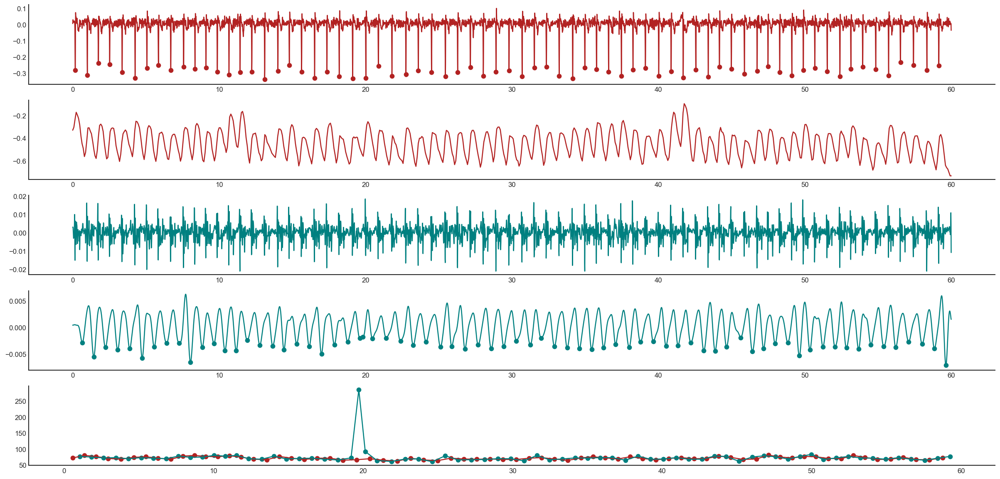

	 use S peaks
	 use S peaks


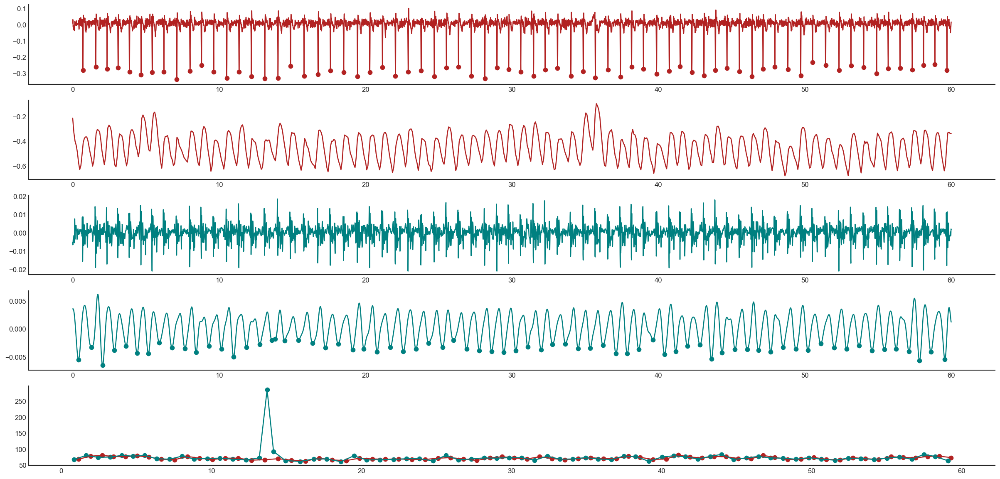

	 use S peaks
	 use S peaks


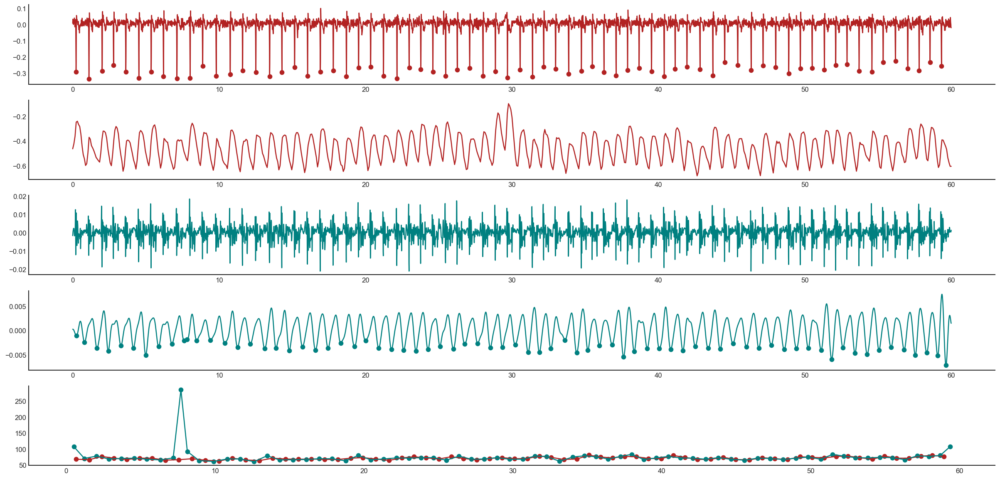

	 use S peaks
	 use S peaks


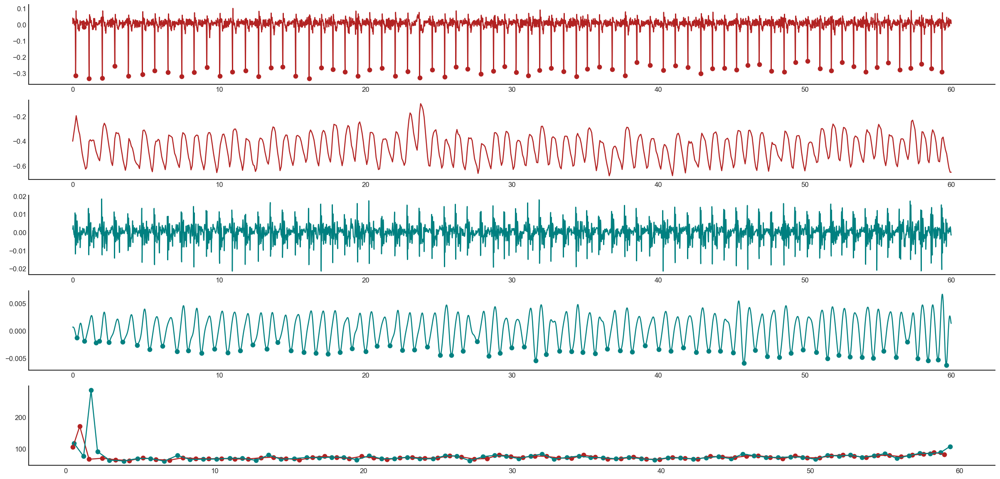

	 use S peaks
	 use S peaks


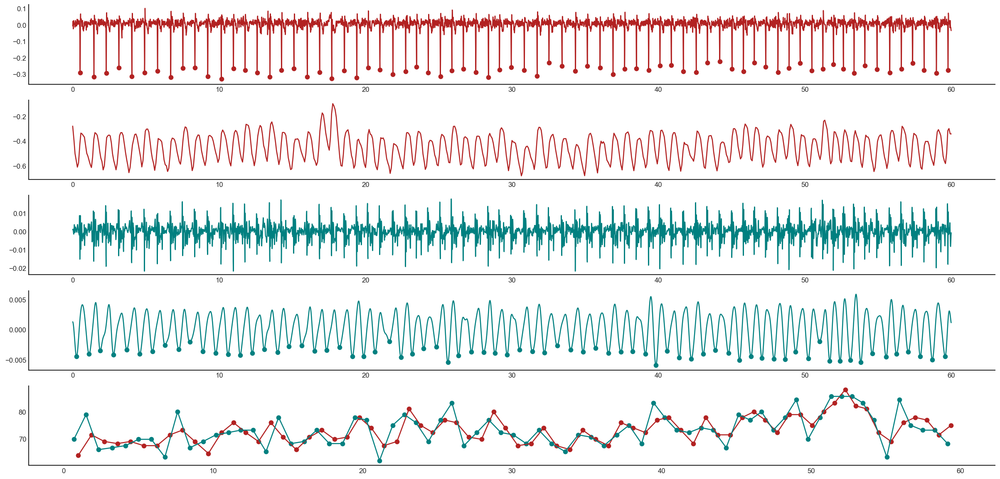

	 use S peaks
	 use S peaks


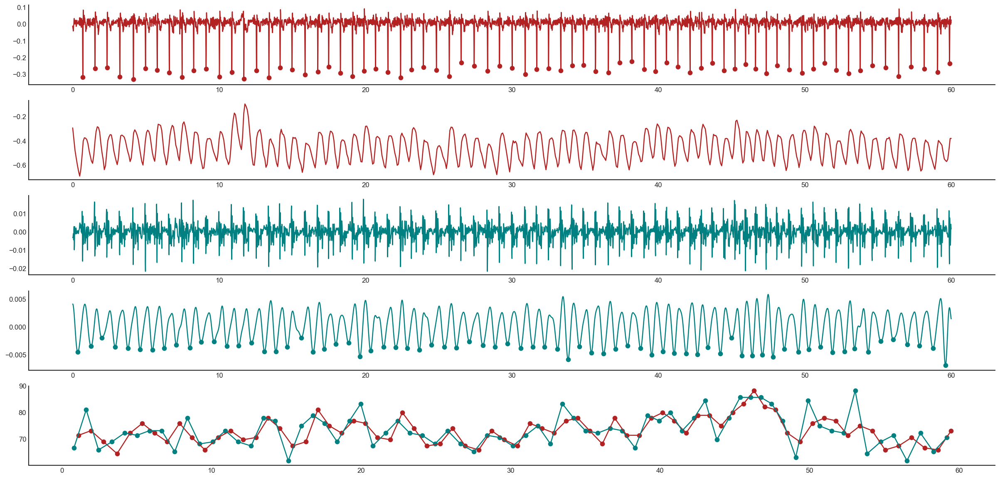

	 use S peaks
	 use S peaks


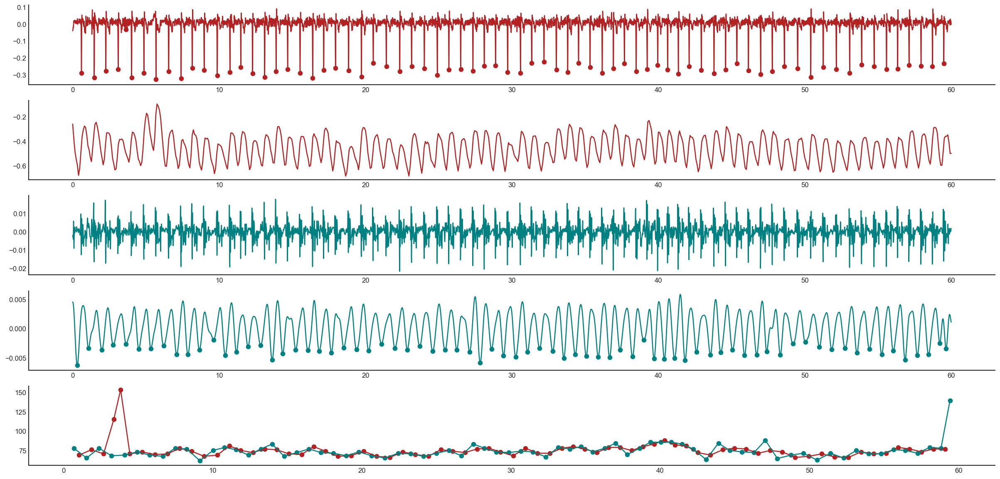

	 use S peaks
	 use S peaks


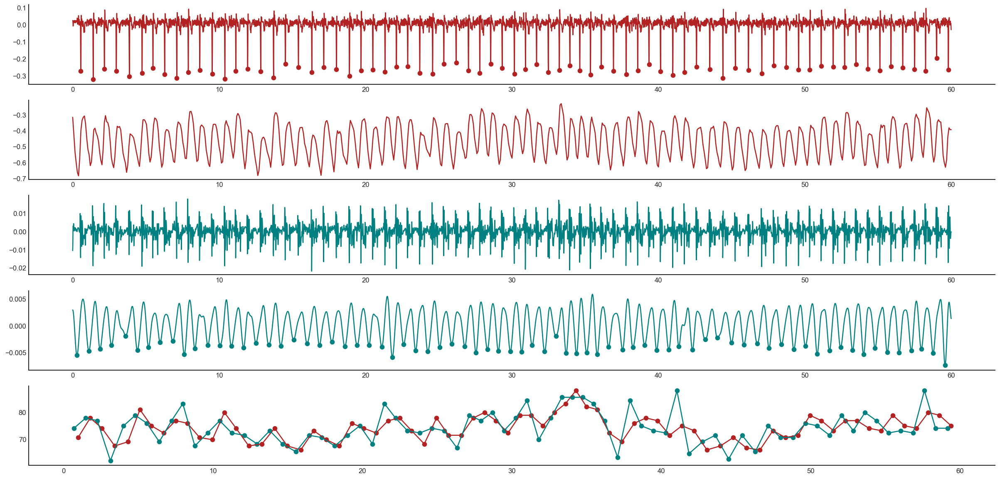

	 use S peaks
	 use S peaks


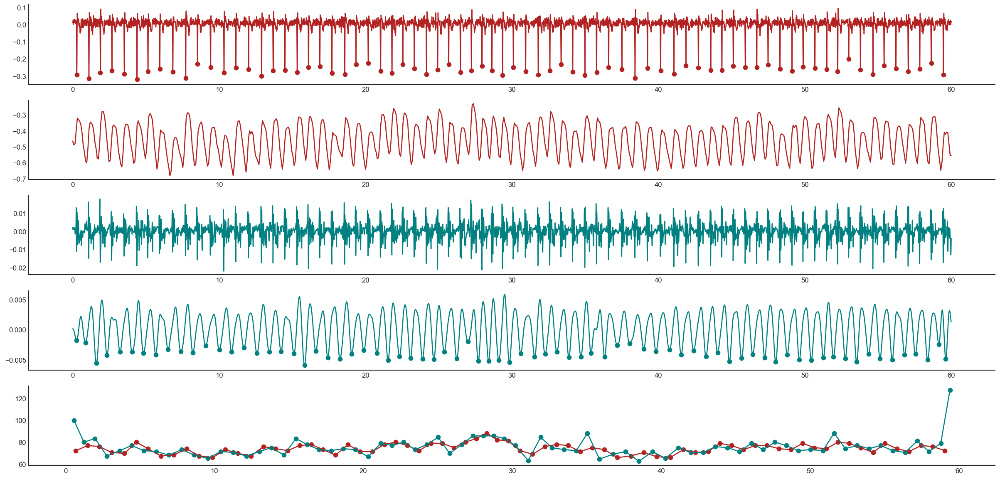

	 use S peaks
	 use S peaks


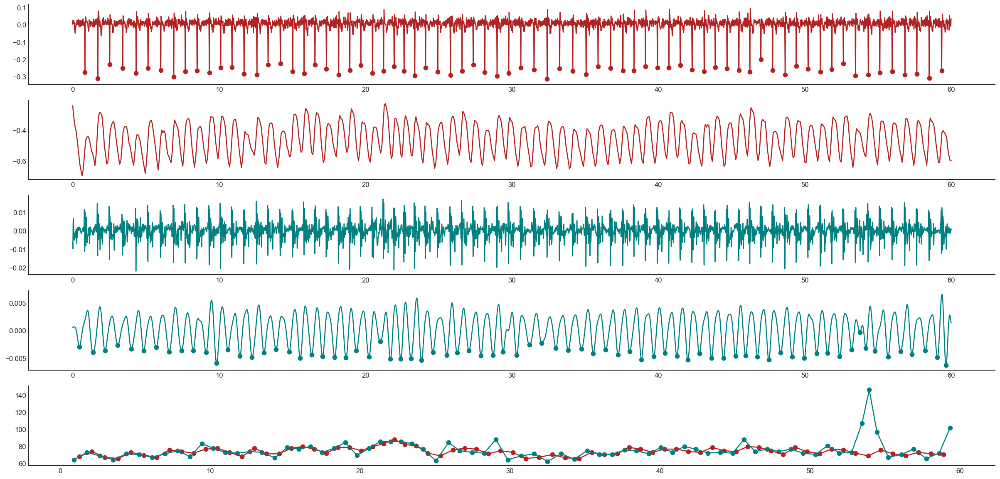

	 use S peaks
	 use S peaks


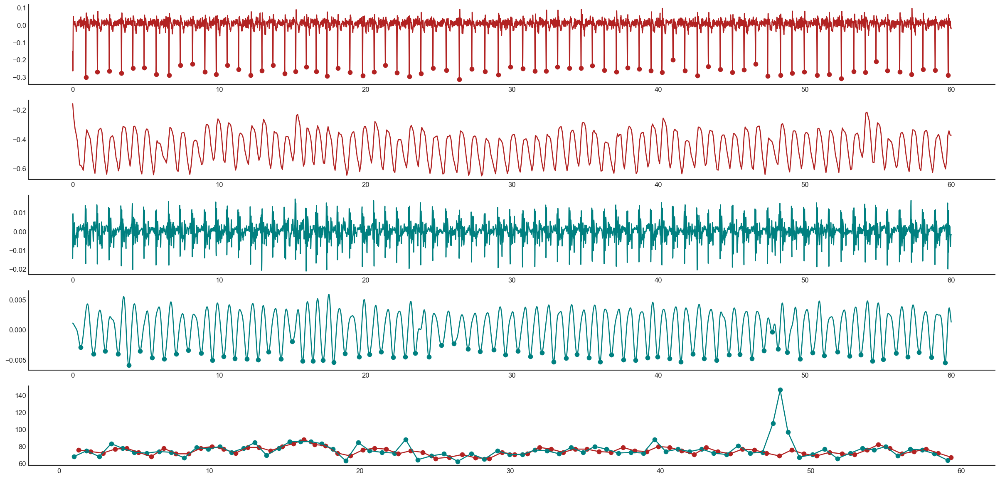

	 use S peaks
	 use S peaks


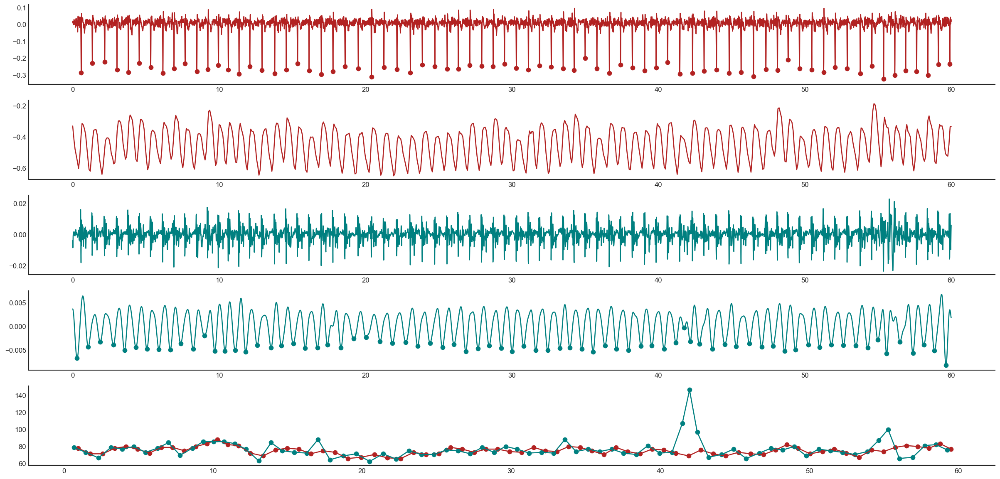

	 use S peaks
	 use S peaks


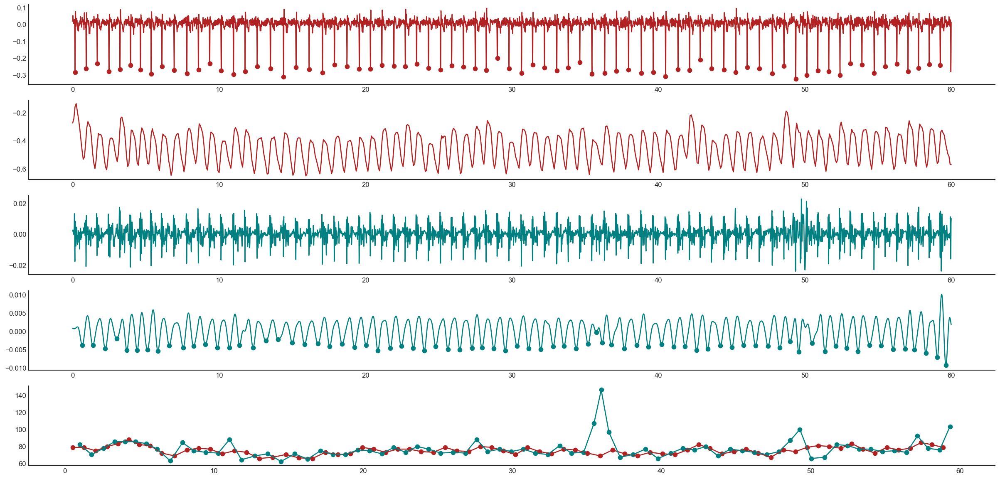

	 use S peaks
	 use S peaks


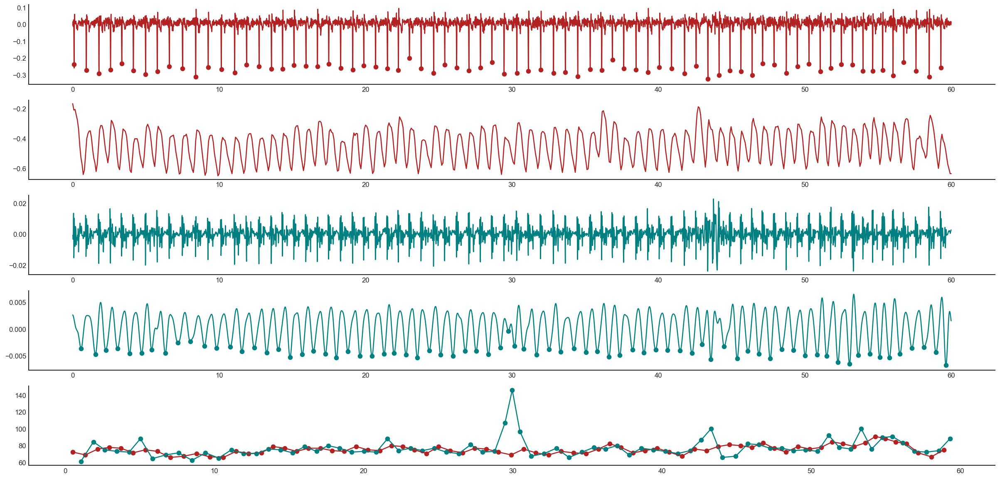

	 use S peaks
	 use S peaks


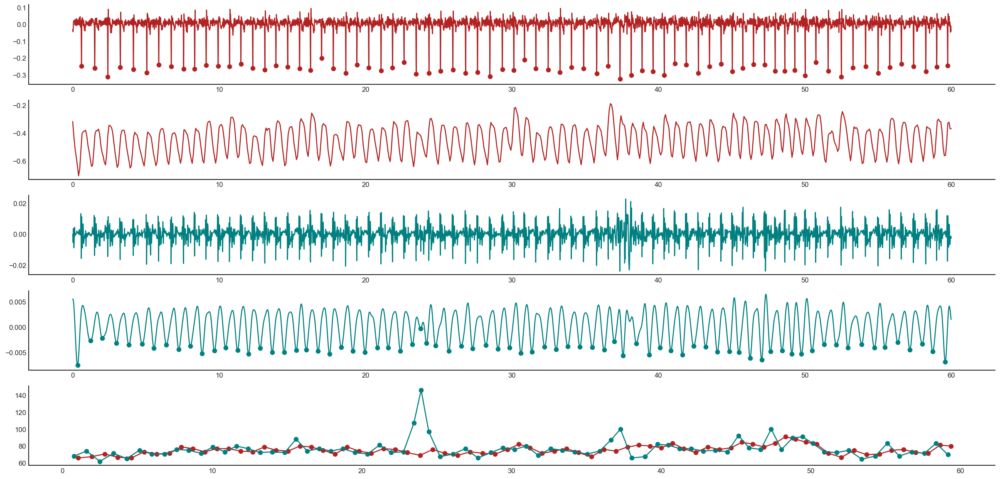

	 use S peaks
	 use S peaks


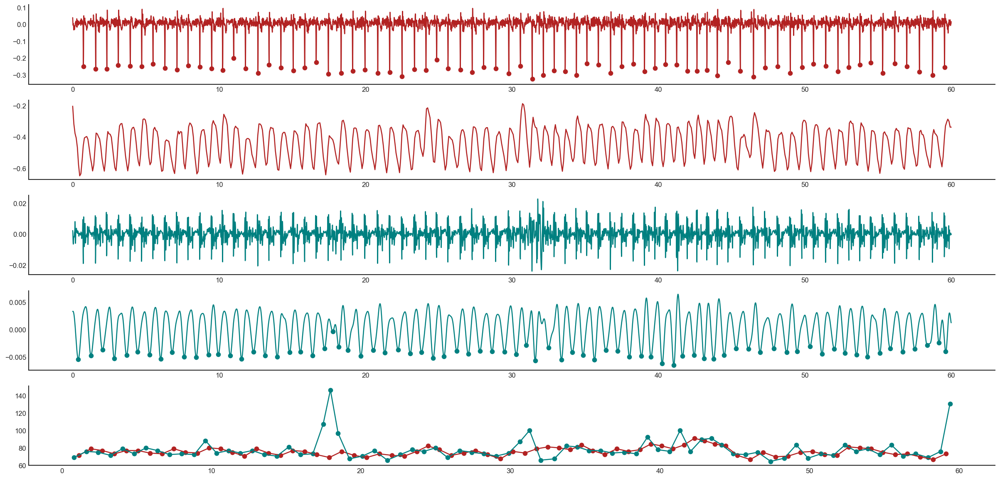

	 use S peaks
	 use S peaks


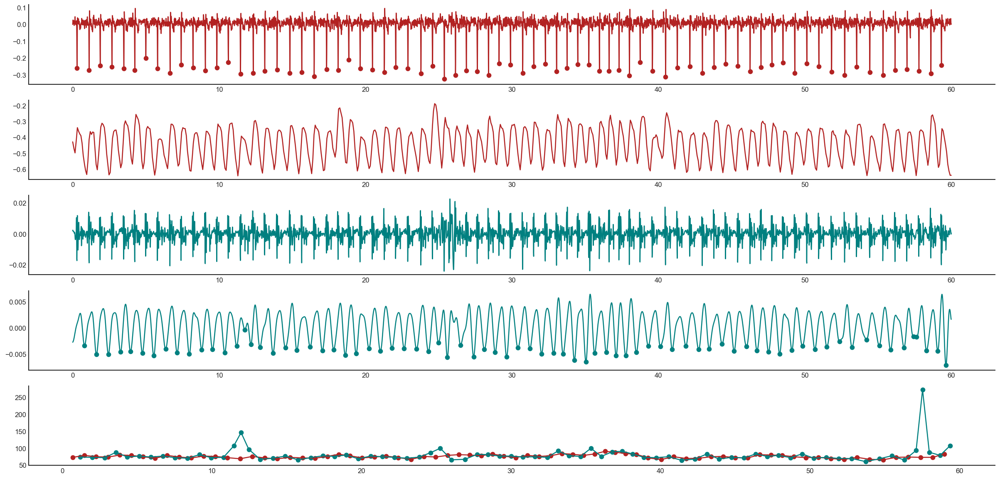

	 use S peaks
	 use S peaks


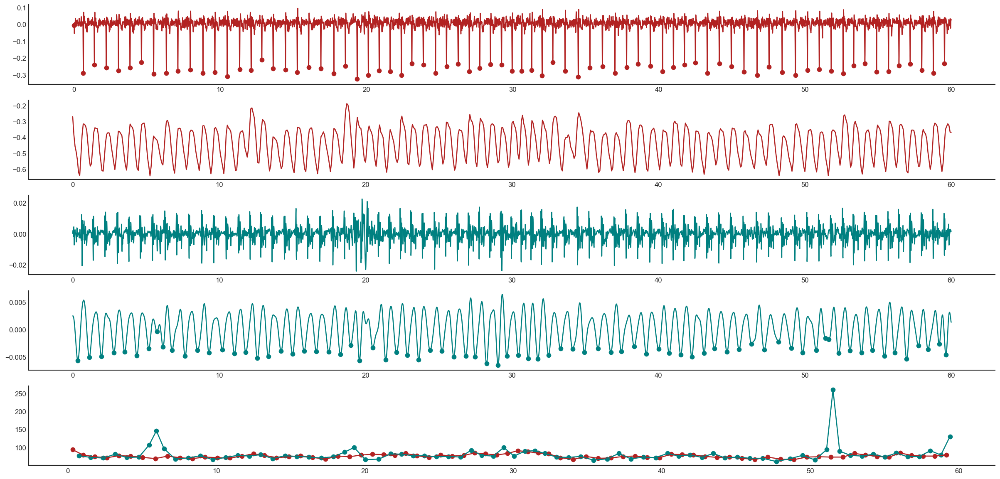

	 use S peaks
	 use S peaks


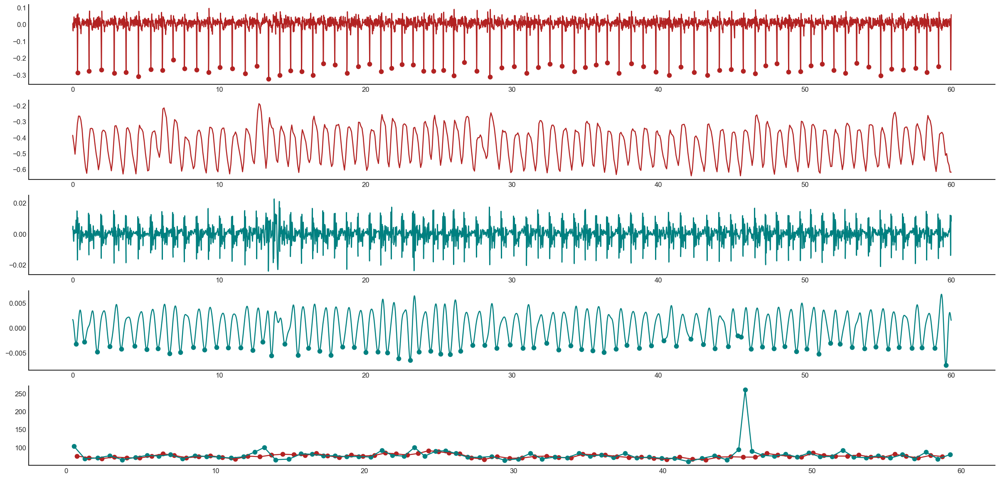

	 use S peaks
	 use S peaks


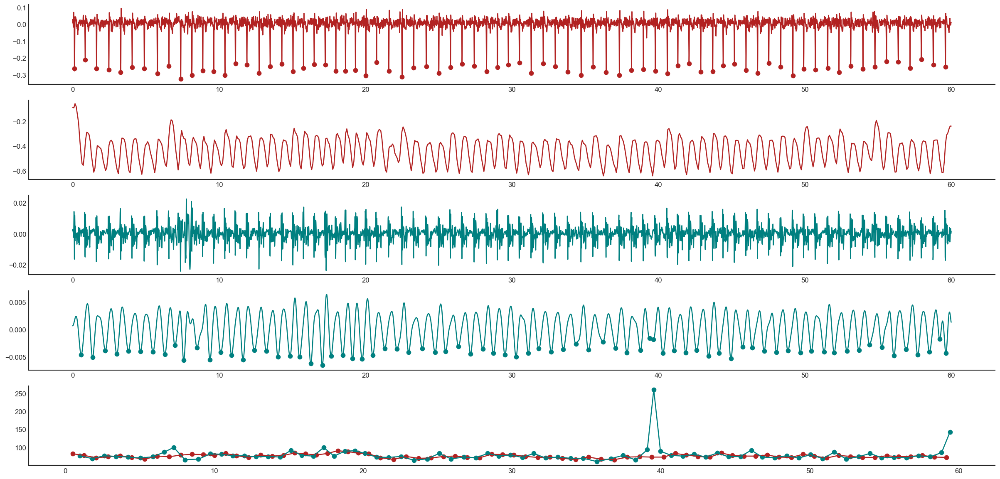

In [50]:
for i_sample in range(data.size()[0]):
    
    sig0 = data[:,[0],:]
    sig1 = data[:,[1],:]

    # A few notes:
    # 1. make regressor type None
    # 2. send raw signal to ECG feature extractor or SCG feature extractor
    # 3. the deep features are the one you want to use. It's a smoother version of the ECG/SCG
    model.feature_extractors.ECG_filt.regressor_type = 'None'
    deep_ecg = model.feature_extractors.ECG_filt(sig0)
    model.feature_extractors.scgZ.regressor_type = 'None'
    deep_scg = model.feature_extractors.scgZ(sig1)

    sig0 = sig0[i_sample, 0, :].data.detach().cpu().numpy()
    sig1 = sig1[i_sample, 0, :].data.detach().cpu().numpy()

    QRS_detector_dict_patch = task_HR_detector(sig0, training_params['FS_RESAMPLE_DL'], beat_choice = 'i_S_peaks', fig_name=None, outputdir=None, show_plot=False)
    i_peaks = QRS_detector_dict_patch['i_S_peaks']

    deep_ecg = deep_ecg[i_sample, 0, :].data.detach().cpu().numpy()
    deep_scg = deep_scg[i_sample, 0, :].data.detach().cpu().numpy()

    t_deep = np.arange(deep_ecg.shape[0]) / training_params['FS_Extracted']
    t_raw = np.arange(sig0.shape[0]) / training_params['FS_RESAMPLE_DL']

    deep_ecg = np.interp(t_raw, t_deep, deep_ecg)
    deep_scg = np.interp(t_raw, t_deep, deep_scg)

    deep_scg_filt = get_filt(deep_scg, training_params['FS_RESAMPLE_DL'], lowcutoff=40/60, highcutoff=150/60)
    deep_scg_filt = np.gradient(deep_scg_filt)
    peak_idx, _ = find_peaks(-deep_scg_filt, height=deep_scg_filt.std()*0.1)


    fig, axes = plt.subplots(5,1,figsize=(25,12), dpi=120)
    # plot ECG signal
    axes[0].plot(t_raw, sig0, color='firebrick')
    axes[0].scatter(t_raw[i_peaks], QRS_detector_dict_patch['ecg_filt1'][i_peaks], color='firebrick')

    # plot deep ECG features
    axes[1].plot(t_raw, deep_ecg,  color='firebrick')

    # plot SCG signal
    axes[2].plot(t_raw, sig1, color='Teal')

    # plot deep SCG features
    axes[3].plot(t_raw, deep_scg_filt,  color='Teal')
    axes[3].scatter(t_raw[peak_idx], deep_scg_filt[peak_idx],  color='Teal')

    # plot beat-by-beat HR from ECG and SCG
    axes[4].scatter((t_raw[i_peaks[1:]] + t_raw[i_peaks[:-1]]) / 2, 60/np.diff(t_raw[i_peaks]), color='firebrick')
    axes[4].plot((t_raw[i_peaks[1:]] + t_raw[i_peaks[:-1]]) / 2, 60/np.diff(t_raw[i_peaks]), color='firebrick')
    axes[4].scatter((t_raw[peak_idx[1:]] + t_raw[peak_idx[:-1]]) / 2, 60/np.diff(t_raw[peak_idx]), color='Teal')
    axes[4].plot((t_raw[peak_idx[1:]] + t_raw[peak_idx[:-1]]) / 2, 60/np.diff(t_raw[peak_idx]), color='Teal')
    
    for ax in axes:
        ax_no_top_right(ax)
    plt.show()

    # ax.plot(60/(np.diff(pea .k_idx)/training_params['FS_Extracted']))